### Bessel Function


COMPUTING SPECIFIC MODES...

m (Radial)  n (Angular) Freq (Hz)   
------------------------------------
1           1           470.38      
1           2           610.42      
1           3           756.92      
2           2           1005.42     
2           3           1158.58     
3           3           1546.96     


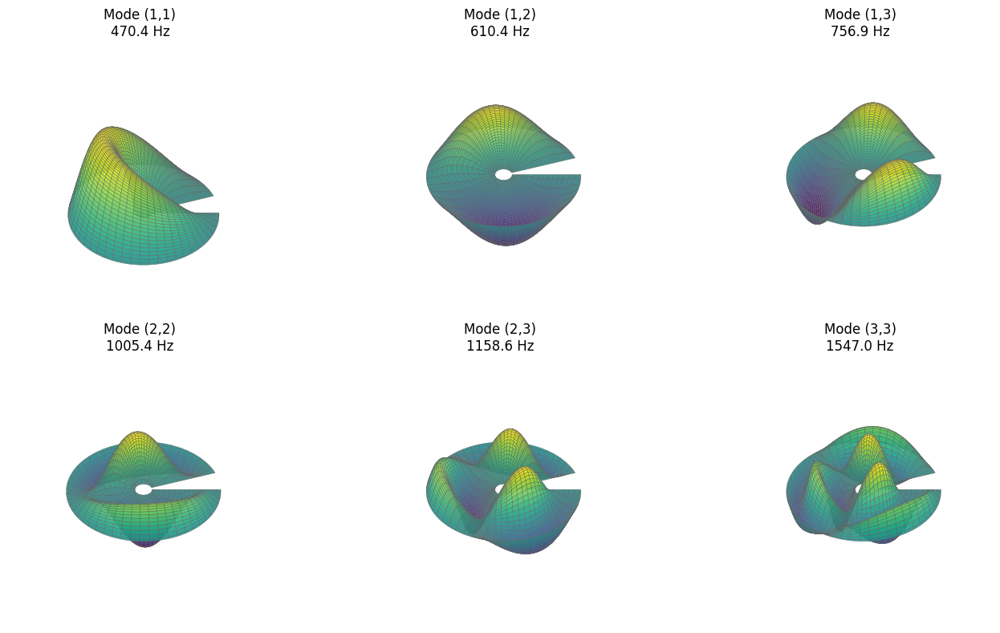

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import jn, yn
from scipy.optimize import brentq
from matplotlib import cm

# ==================================================
# 1. Physical parameters (SI units)
# ==================================================
R1 = 0.5e-3     # inner radius (m)
R2 = 4.5e-3     # outer radius (m)
alpha = np.deg2rad(340)

T = 1.35        # N/m
rho = 0.12      # kg/m^2

# ==================================================
# 2. Characteristic equation (Wu et al., Eq. 27)
# ==================================================
def characteristic_eq(k, n):
    return jn(n, k*R1)*yn(n, k*R2) - jn(n, k*R2)*yn(n, k*R1)

# ==================================================
# 3. Eigenvalue solver (radial roots)
# ==================================================
def find_roots(n, num_roots=6, k_max=5e4):
    roots = []
    # Increased resolution slightly to ensure higher roots are caught
    grid = np.linspace(1e-6, k_max, 60000)
    fvals = characteristic_eq(grid, n)

    for i in range(len(grid) - 1):
        if fvals[i] * fvals[i+1] < 0:
            root = brentq(characteristic_eq, grid[i], grid[i+1], args=(n,))
            roots.append(root)
            if len(roots) == num_roots:
                break
    return np.array(roots)

# ==================================================
# 4. Frequency (Hz)
# ==================================================
def natural_frequency(k):
    return (k * np.sqrt(T / rho)) / (2*np.pi)

# ==================================================
# 5. Mode shape (Eq. 29)
# ==================================================
def mode_shape(r, theta, k, n):
    radial = jn(n, k*r) - (jn(n, k*R2)/yn(n, k*R2)) * yn(n, k*r)
    # Note: n here is the Bessel order.
    # For angular mode shape sin(n_idx * pi * theta / alpha),
    # usually the Bessel order 'n' corresponds to the angular index.
    angular = np.sin(n * np.pi * theta / alpha)
    return radial * angular

# ==================================================
# 6. Compute SPECIFIC analytical modes
# ==================================================
# Format: (m, n) -> m = radial mode index, n = angular mode index (Bessel order)
target_modes = [
    (1, 1),
    (1, 2),
    (1, 3),
    (2, 2),
    (2, 3),
    (3, 3)
]

selected_modes = []

print("\nCOMPUTING SPECIFIC MODES...\n")
print(f"{'m (Radial)':<12}{'n (Angular)':<12}{'Freq (Hz)':<12}")
print("-"*36)

for m_req, n_req in target_modes:
    # We find enough roots to get the m-th one
    # Note: We assume n_req maps directly to the Bessel order n
    roots = find_roots(n_req, num_roots=m_req)

    if len(roots) < m_req:
        print(f"Warning: Could not find root {m_req} for n={n_req}")
        continue

    k_val = roots[m_req - 1] # Index is m-1
    f_val = natural_frequency(k_val)

    selected_modes.append((m_req, n_req, k_val, f_val))
    print(f"{m_req:<12}{n_req:<12}{f_val:<12.2f}")

# ==================================================
# 7. Visualization
# ==================================================

# Grid generation
r = np.linspace(R1, R2, 100) # Moderate resolution for mesh calculation
theta = np.linspace(0, alpha, 100)
R, TH = np.meshgrid(r, theta)
X = R * np.cos(TH)
Y = R * np.sin(TH)

fig = plt.figure(figsize=(14, 8))

rows, cols = 2, 3

for i, (m, n, k, f) in enumerate(selected_modes):
    Z = mode_shape(R, TH, k, n)
    Z /= np.max(np.abs(Z))  # normalize

    ax = fig.add_subplot(rows, cols, i + 1, projection="3d")

    surf = ax.plot_surface(
        X, Y, Z,
        cmap="viridis",
        vmin=-1,
        vmax=1,
        linewidth=0.3,
        antialiased=True,
        edgecolor='0.4',
        alpha=0.9,
        rcount=60, # High visual density as requested
        ccount=60
    )

    # View and Aspect settings
    ax.view_init(elev=40, azim=-110)
    ax.set_box_aspect([1, 1, 0.6])
    ax.set_axis_off()

    ax.set_title(
        f"Mode ({m},{n})\n{f:.1f} Hz",
        fontsize=12,
        pad=10
    )

plt.tight_layout()
plt.show()

### FD

Building system matrix...
Solving for first 24 modes...

Mode  Freq (Hz)     (m,k)     
1     421.54        (1,1)
2     477.65        (1,2)
3     550.05        (1,3)
4     627.21        (1,4)
5     704.57        (1,5)
6     780.88        (1,6)
7     839.61        (2,1)
8     855.98        (1,7)
9     882.60        (2,2)
10    929.95        (1,8)
11    946.27        (2,3)
12    1002.86       (1,9)
13    1021.83       (2,4)
14    1074.80       (1,10)
15    1102.22       (2,5)
16    1145.82       (1,11)
17    1183.54       (2,6)
18    1215.96       (1,12)
19    1256.89       (3,1)
20    1264.23       (2,7)
21    1285.24       (1,13)
22    1290.59       (3,2)
23    1343.76       (3,3)
24    1343.82       (2,8)


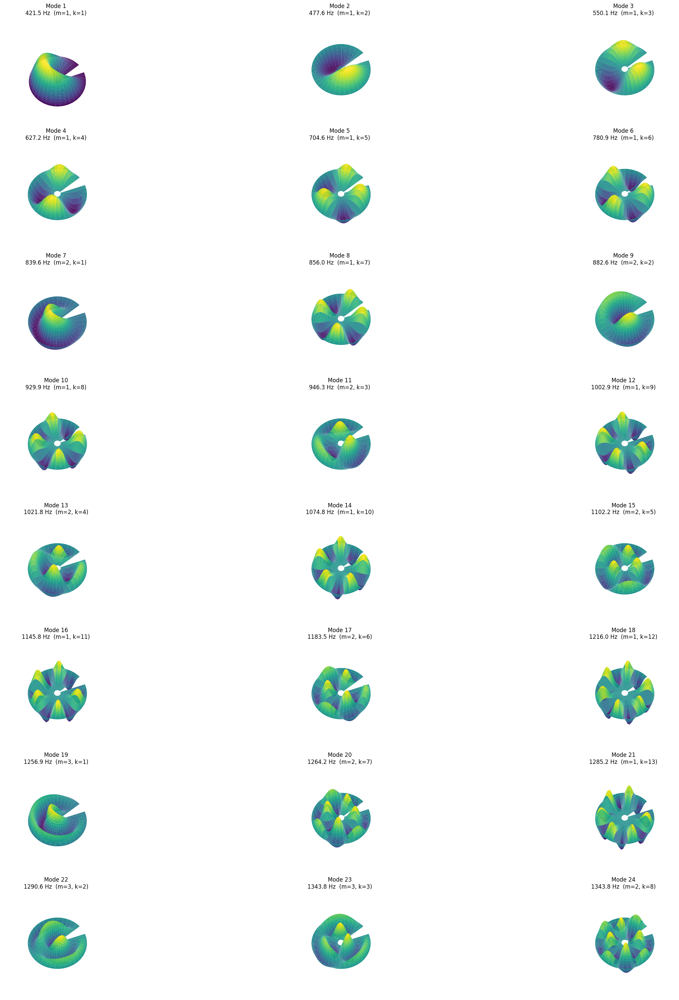

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import eigs
from scipy.signal import argrelextrema
from mpl_toolkits.mplot3d import Axes3D

# ==================================================
# 1. Physical parameters (SI units)
# ==================================================
R1 = 0.5e-3      # inner radius (m)
R2 = 4.5e-3      # outer radius (m)
alpha = np.deg2rad(340)

T = 1.35         # membrane tension (N/m)
rho = 0.12       # mass per unit area (kg/m^2)

# ==================================================
# 2. Grid
# ==================================================
Nr = 45
Ntheta = 70

dr = (R2 - R1) / (Nr - 1)
dtheta = alpha / (Ntheta - 1)

r = np.linspace(R1, R2, Nr)
theta = np.linspace(0, alpha, Ntheta)

def idx(i, j):
    return i * Ntheta + j

N = Nr * Ntheta
A = lil_matrix((N, N))
interior_nodes = []

# ==================================================
# 3. Finite-difference Laplacian (polar coordinates)
# ==================================================
print("Building system matrix...")

for i in range(Nr):
    for j in range(Ntheta):
        p = idx(i, j)

        # Dirichlet BC: w = 0 on all boundaries
        if i == 0 or i == Nr - 1 or j == 0 or j == Ntheta - 1:
            continue

        interior_nodes.append(p)
        ri = r[i]

        cr2 = 1.0 / dr**2
        cr1 = 1.0 / (2.0 * ri * dr)
        cth2 = 1.0 / (ri**2 * dtheta**2)

        A[p, idx(i + 1, j)] = cr2 + cr1
        A[p, idx(i - 1, j)] = cr2 - cr1
        A[p, idx(i, j + 1)] = cth2
        A[p, idx(i, j - 1)] = cth2
        A[p, p] = -2.0 * cr2 - 2.0 * cth2

A_inner = A.tocsr()[interior_nodes, :][:, interior_nodes]

# ==================================================
# 4. Eigenvalue problem
# ==================================================
num_modes = 24
print(f"Solving for first {num_modes} modes...")

eigvals, eigvecs_inner = eigs(A_inner, k=num_modes, which="SM")

# Frequencies (Hz)
freqs = np.sqrt(T / rho * (-np.real(eigvals))) / (2 * np.pi)

order = np.argsort(freqs)
freqs = freqs[order]
eigvecs_inner = eigvecs_inner[:, order]

# Reconstruct full eigenvectors
full_modes = np.zeros((N, num_modes))
for k in range(num_modes):
    full_modes[interior_nodes, k] = np.real(eigvecs_inner[:, k])

# ==================================================
# 5. Deterministic sign convention (CRITICAL)
# ==================================================
def enforce_sign(phi):
    grid = phi.reshape((Nr, Ntheta))
    idx_max = np.unravel_index(np.argmax(np.abs(grid)), grid.shape)
    if grid[idx_max] < 0:
        phi = -phi
    return phi

for k in range(num_modes):
    full_modes[:, k] = enforce_sign(full_modes[:, k])

# ==================================================
# 6. Mode classification (m, k)
# ==================================================
def classify_mode(phi):
    grid = phi.reshape((Nr, Ntheta))
    idx_max = np.unravel_index(np.argmax(np.abs(grid)), grid.shape)

    slice_theta = grid[idx_max[0], :]
    slice_r = grid[:, idx_max[1]]

    k = (
        len(argrelextrema(slice_theta, np.greater)[0])
        + len(argrelextrema(slice_theta, np.less)[0])
    )
    m = (
        len(argrelextrema(slice_r, np.greater)[0])
        + len(argrelextrema(slice_r, np.less)[0])
    )
    return m, k

# ==================================================
# 7. Results table
# ==================================================
print("\n========================================")
print(f"{'Mode':<6}{'Freq (Hz)':<14}{'(m,k)':<10}")
print("========================================")

for i in range(num_modes):
    m, k = classify_mode(full_modes[:, i])
    print(f"{i+1:<6}{freqs[i]:<14.2f}({m},{k})")

# ==================================================
# 8. Plotting (publication-stable)
# ==================================================
R, TH = np.meshgrid(r, theta, indexing="ij")
X = R * np.cos(TH)
Y = R * np.sin(TH)

fig = plt.figure(figsize=(90,90))

rows, cols = 8, 3

for i in range(num_modes):
    phi = full_modes[:, i].reshape((Nr, Ntheta))
    phi /= np.max(np.abs(phi))

    m, k = classify_mode(phi.flatten())

    ax = fig.add_subplot(rows, cols, i + 1, projection="3d")
    ax.plot_surface(X, Y, phi, cmap="viridis", linewidth=0)

    ax.view_init(elev=60, azim=230)
    ax.set_title(f"Mode {i+1}\n{freqs[i]:.1f} Hz  (m={m}, k={k})")
    ax.set_axis_off()

plt.tight_layout()
plt.show()


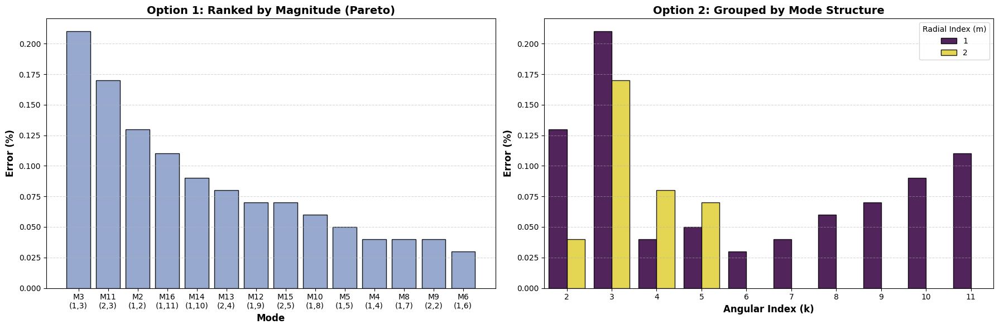

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Data reconstruction
data = [
    {"label": "M2", "m": 1, "k": 2, "error": 0.13},
    {"label": "M3", "m": 1, "k": 3, "error": 0.21},
    {"label": "M4", "m": 1, "k": 4, "error": 0.04},
    {"label": "M5", "m": 1, "k": 5, "error": 0.05},
    {"label": "M6", "m": 1, "k": 6, "error": 0.03},
    {"label": "M8", "m": 1, "k": 7, "error": 0.04},
    {"label": "M9", "m": 2, "k": 2, "error": 0.04},
    {"label": "M10", "m": 1, "k": 8, "error": 0.06},
    {"label": "M11", "m": 2, "k": 3, "error": 0.17},
    {"label": "M12", "m": 1, "k": 9, "error": 0.07},
    {"label": "M13", "m": 2, "k": 4, "error": 0.08},
    {"label": "M14", "m": 1, "k": 10, "error": 0.09},
    {"label": "M15", "m": 2, "k": 5, "error": 0.07},
    {"label": "M16", "m": 1, "k": 11, "error": 0.11}
]

df = pd.DataFrame(data)

# Setup figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# --- Option 1: Sorted Bar Chart ---
df_sorted = df.sort_values('error', ascending=False)
labels_sorted = [f"{r['label']}\n({r['m']},{r['k']})" for _, r in df_sorted.iterrows()]

axes[0].bar(labels_sorted, df_sorted['error'], color='#8da0cb', edgecolor='black', alpha=0.9)
axes[0].set_title('Option 1: Ranked by Magnitude (Pareto)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Error (%)', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Mode', fontsize=12, fontweight='bold')
axes[0].grid(axis='y', linestyle='--', alpha=0.5)

# --- Option 2: Grouped by Structure (m vs k) ---
sns.barplot(data=df, x='k', y='error', hue='m', ax=axes[1], palette='viridis', edgecolor='black', alpha=0.9)
axes[1].set_title('Option 2: Grouped by Mode Structure', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Error (%)', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Angular Index (k)', fontsize=12, fontweight='bold')
axes[1].legend(title='Radial Index (m)')
axes[1].grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

### Error calculations

--- Computing Analytical Modes (Fractional Order) ---


/tmp/ipython-input-59557856.py:25: RuntimeWarning: floating point number truncated to an integer
  return jn(v, k_wave*R1)*yn(v, k_wave*R2) - jn(v, k_wave*R2)*yn(v, k_wave*R1)


Stored 60 analytical modes.

--- Building High-Resolution FD Matrix (~5-10s) ---
Solving for lowest 16 modes using Shift-Invert...

Mode   (m, k)     FD Freq      Analytic     Error (%) 
1      (1,1):     421.55       416.46       1.221     
2      (1,2):     477.71       478.35       0.134     
3      (1,3):     550.25       551.42       0.211     
4      (1,4):     627.66       627.90       0.039     
5      (1,5):     705.38       705.72       0.048     
6      (1,6):     782.21       782.47       0.033     
7      (2,1):     840.04       827.63       1.499     
8      (1,7):     858.02       858.40       0.044     
9      (2,2):     883.06       883.43       0.042     
10     (1,8):     932.91       933.44       0.057     
11     (2,3):     946.88       945.25       0.172     
12     (1,9):     1007.00      1007.73      0.073     
13     (2,4):     1022.73      1023.50      0.075     
14     (1,10):     1080.38      1081.37      0.092     
15     (2,5):     1103.58      1104.36    

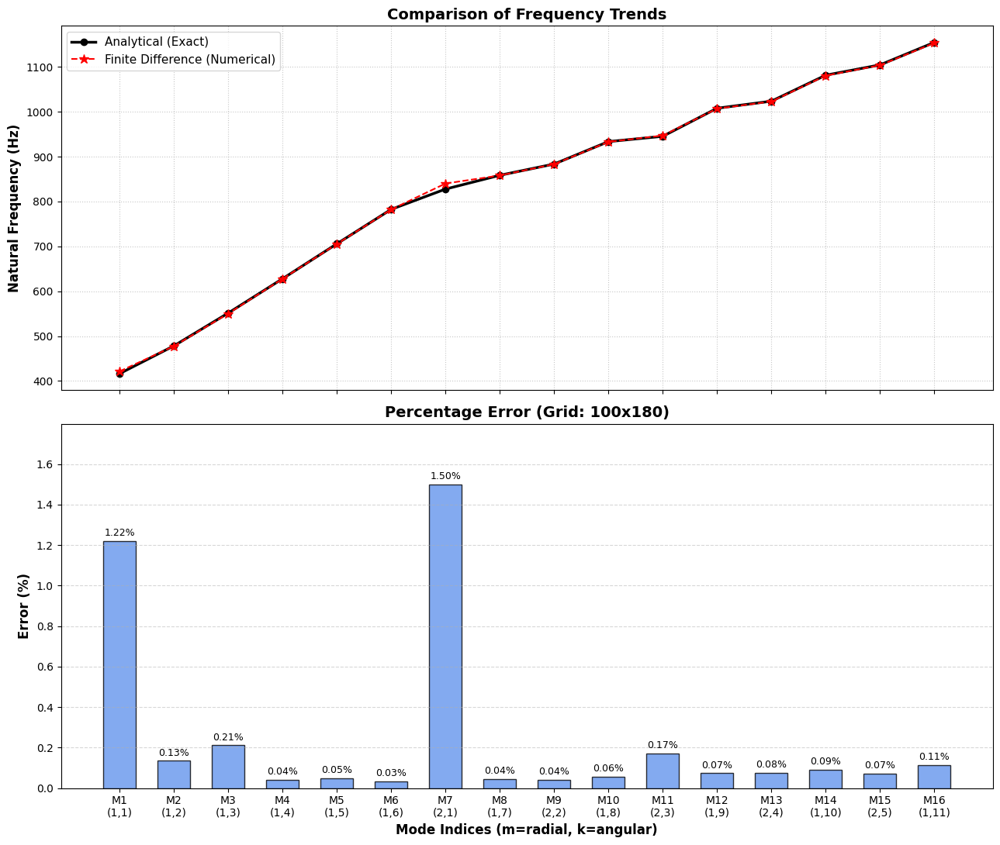

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import jn, yn
from scipy.optimize import brentq
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import eigs
from mpl_toolkits.mplot3d import Axes3D

# ==================================================
# 1. Global Physical Parameters
# ==================================================
R1 = 0.5e-3      # inner radius (m)
R2 = 4.5e-3      # outer radius (m)
alpha = np.deg2rad(340)

T = 1.35         # N/m
rho = 0.12       # kg/m^2

# ==================================================
# PART A: ANALYTICAL SOLVER (Corrected)
# ==================================================
print("--- Computing Analytical Modes (Fractional Order) ---")

def characteristic_eq(k_wave, v):
    return jn(v, k_wave*R1)*yn(v, k_wave*R2) - jn(v, k_wave*R2)*yn(v, k_wave*R1)

def find_roots_analytical(v, num_roots=5):
    roots = []
    grid = np.linspace(1e-6, 5e4, 50000)
    fvals = characteristic_eq(grid, v)
    for i in range(len(grid) - 1):
        if fvals[i] * fvals[i+1] < 0:
            try:
                root = brentq(characteristic_eq, grid[i], grid[i+1], args=(v,))
                roots.append(root)
            except: pass
            if len(roots) == num_roots:
                break
    return np.array(roots)

analytical_db = {}
# Search wider range to match potential higher FD modes
max_n_search = 15  # Angular index n
max_m_search = 4   # Radial index m

for n in range(1, max_n_search + 1):
    nu = (n * np.pi) / alpha # Scaling for 340-degree sector
    roots = find_roots_analytical(nu, max_m_search)
    for m_idx, k_val in enumerate(roots):
        m = m_idx + 1
        freq = (k_val * np.sqrt(T / rho)) / (2*np.pi)
        analytical_db[(m, n)] = freq

print(f"Stored {len(analytical_db)} analytical modes.\n")

# ==================================================
# PART B: FINITE DIFFERENCE SOLVER (High Res)
# ==================================================
print("--- Building High-Resolution FD Matrix (~5-10s) ---")

Nr = 100
Ntheta = 180
dr = (R2 - R1) / (Nr - 1)
dtheta = alpha / (Ntheta - 1)
r = np.linspace(R1, R2, Nr)

def idx(i, j): return i * Ntheta + j

N = Nr * Ntheta
A = lil_matrix((N, N))
interior_nodes = []

for i in range(1, Nr-1):
    for j in range(1, Ntheta-1):
        p = idx(i, j)
        interior_nodes.append(p)
        ri = r[i]
        cr2 = 1.0 / dr**2
        cr1 = 1.0 / (2.0 * ri * dr)
        cth2 = 1.0 / (ri**2 * dtheta**2)
        A[p, idx(i + 1, j)] = cr2 + cr1
        A[p, idx(i - 1, j)] = cr2 - cr1
        A[p, idx(i, j + 1)] = cth2
        A[p, idx(i, j - 1)] = cth2
        A[p, p] = -2.0 * cr2 - 2.0 * cth2

A_inner = A.tocsr()[interior_nodes, :][:, interior_nodes]

num_fd_modes = 16
print(f"Solving for lowest {num_fd_modes} modes using Shift-Invert...")
eigvals, eigvecs_inner = eigs(A_inner, k=num_fd_modes, sigma=0, which="LM")

freqs_fd = np.sqrt(T / rho * (-np.real(eigvals))) / (2 * np.pi)
order = np.argsort(freqs_fd)
freqs_fd = freqs_fd[order]
eigvecs_inner = eigvecs_inner[:, order]

full_modes = np.zeros((N, num_fd_modes))
for k in range(num_fd_modes):
    full_modes[interior_nodes, k] = np.real(eigvecs_inner[:, k])

# ==================================================
# PART C: ROBUST CLASSIFICATION & DATA GATHERING
# ==================================================
def classify_mode_robust(phi):
    grid = phi.reshape((Nr, Ntheta))
    idx_max = np.unravel_index(np.argmax(np.abs(grid)), grid.shape)
    s_th = grid[idx_max[0], :]
    s_r = grid[:, idx_max[1]]

    # Count sign changes (Zero Crossings)
    s_th_clean = s_th[np.abs(s_th) > 1e-5 * np.max(np.abs(s_th))]
    crossings_th = len(np.where(np.diff(np.sign(s_th_clean)))[0])
    k_ang = crossings_th + 1

    s_r_clean = s_r[np.abs(s_r) > 1e-5 * np.max(np.abs(s_r))]
    crossings_r = len(np.where(np.diff(np.sign(s_r_clean)))[0])
    m_rad = crossings_r + 1
    return m_rad, k_ang

print("\n==========================================================================")
print(f"{'Mode':<6} {'(m, k)':<10} {'FD Freq':<12} {'Analytic':<12} {'Error (%)':<10}")
print("==========================================================================")

# Lists to store data for plotting
match_labels = []
match_fd_freqs = []
match_ana_freqs = []
match_errors = []

for i in range(num_fd_modes):
    phi = full_modes[:, i]
    if np.max(phi) < np.abs(np.min(phi)): phi = -phi # Consistent sign

    m, k = classify_mode_robust(phi)
    fd_f = freqs_fd[i]

    if (m, k) in analytical_db:
        ana_f = analytical_db[(m, k)]
        error_pct = abs((ana_f - fd_f) / ana_f) * 100

        print(f"{i+1:<6} ({m},{k}):{' '*4} {fd_f:<12.2f} {ana_f:<12.2f} {error_pct:<10.3f}")

        # Store matched data
        match_labels.append(f"M{i+1}\n({m},{k})")
        match_fd_freqs.append(fd_f)
        match_ana_freqs.append(ana_f)
        match_errors.append(error_pct)
    else:
        print(f"{i+1:<6} ({m},{k}):{' '*4} {fd_f:<12.2f} {'---':<12} {'---':<10}")

print("==========================================================================\n")

# ==================================================
# PART D: PLOTTING (Subplots)
# ==================================================
if not match_labels:
    print("Error: No modes matched for plotting.")
    exit()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(13, 11), sharex=True)

# --- Top Plot: Frequency Curves ---
# Plot Analytical as solid black line
ax1.plot(match_labels, match_ana_freqs, 'ko-', label='Analytical (Exact)', linewidth=2.5, markersize=6)
# Plot FD as dashed red line with different markers
ax1.plot(match_labels, match_fd_freqs, 'r*--', label='Finite Difference (Numerical)', linewidth=1.5, markersize=9)

ax1.set_ylabel('Natural Frequency (Hz)', fontsize=12, fontweight='bold')
ax1.set_title('Comparison of Frequency Trends', fontsize=14, fontweight='bold')
ax1.grid(True, linestyle=':', alpha=0.7)
ax1.legend(fontsize=11)

# --- Bottom Plot: Error Bars (same as before, moved to ax2) ---
bars = ax2.bar(match_labels, match_errors, color='cornflowerblue', edgecolor='black', alpha=0.8, width=0.6)

ax2.set_ylabel('Error (%)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Mode Indices (m=radial, k=angular)', fontsize=12, fontweight='bold')
ax2.set_title(f'Percentage Error (Grid: {Nr}x{Ntheta})', fontsize=14, fontweight='bold')
ax2.grid(axis='y', linestyle='--', alpha=0.5)

# Dynamic ylim based on max error
max_err_plot = max(match_errors) if match_errors else 1
ax2.set_ylim(0, max_err_plot * 1.2)

# Add text labels on bars
for bar in bars:
    yval = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2, yval + (max_err_plot * 0.01), f"{yval:.2f}%", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import eigs
from scipy.signal import argrelextrema
from mpl_toolkits.mplot3d import Axes3D

# ==================================================
# 1. Physical parameters (SI units)
# ==================================================
R1 = 0.5e-3      # inner radius (m)
R2 = 4.5e-3      # outer radius (m)
alpha = np.deg2rad(340)

T = 1.35         # membrane tension (N/m)
rho = 0.12       # mass per unit area (kg/m^2)

# ==================================================
# 2. Grid
# ==================================================
Nr = 45
Ntheta = 70

dr = (R2 - R1) / (Nr - 1)
dtheta = alpha / (Ntheta - 1)

r = np.linspace(R1, R2, Nr)
theta = np.linspace(0, alpha, Ntheta)

def idx(i, j):
    return i * Ntheta + j

N = Nr * Ntheta
A = lil_matrix((N, N))
interior_nodes = []

# ==================================================
# 3. Finite-difference Laplacian (polar coordinates)
# ==================================================
print("Building system matrix...")

for i in range(Nr):
    for j in range(Ntheta):
        p = idx(i, j)

        # Dirichlet BC: w = 0 on all boundaries
        if i == 0 or i == Nr - 1 or j == 0 or j == Ntheta - 1:
            continue

        interior_nodes.append(p)
        ri = r[i]

        cr2 = 1.0 / dr**2
        cr1 = 1.0 / (2.0 * ri * dr)
        cth2 = 1.0 / (ri**2 * dtheta**2)

        A[p, idx(i + 1, j)] = cr2 + cr1
        A[p, idx(i - 1, j)] = cr2 - cr1
        A[p, idx(i, j + 1)] = cth2
        A[p, idx(i, j - 1)] = cth2
        A[p, p] = -2.0 * cr2 - 2.0 * cth2

A_inner = A.tocsr()[interior_nodes, :][:, interior_nodes]

# ==================================================
# 4. Eigenvalue problem
# ==================================================
num_modes = 24
print(f"Solving for first {num_modes} modes...")

eigvals, eigvecs_inner = eigs(A_inner, k=num_modes, which="SM")

# Frequencies (Hz)
freqs = np.sqrt(T / rho * (-np.real(eigvals))) / (2 * np.pi)

order = np.argsort(freqs)
freqs = freqs[order]
eigvecs_inner = eigvecs_inner[:, order]

# Reconstruct full eigenvectors
full_modes = np.zeros((N, num_modes))
for k in range(num_modes):
    full_modes[interior_nodes, k] = np.real(eigvecs_inner[:, k])

# ==================================================
# 5. Deterministic sign convention (CRITICAL)
# ==================================================
def enforce_sign(phi):
    grid = phi.reshape((Nr, Ntheta))
    idx_max = np.unravel_index(np.argmax(np.abs(grid)), grid.shape)
    if grid[idx_max] < 0:
        phi = -phi
    return phi

for k in range(num_modes):
    full_modes[:, k] = enforce_sign(full_modes[:, k])

# ==================================================
# 6. Mode classification (m, k)
# ==================================================
def classify_mode(phi):
    grid = phi.reshape((Nr, Ntheta))
    idx_max = np.unravel_index(np.argmax(np.abs(grid)), grid.shape)

    slice_theta = grid[idx_max[0], :]
    slice_r = grid[:, idx_max[1]]

    k = (
        len(argrelextrema(slice_theta, np.greater)[0])
        + len(argrelextrema(slice_theta, np.less)[0])
    )
    m = (
        len(argrelextrema(slice_r, np.greater)[0])
        + len(argrelextrema(slice_r, np.less)[0])
    )
    return m, k

# ==================================================
# 7. Results table
# ==================================================
print("\n========================================")
print(f"{'Mode':<6}{'Freq (Hz)':<14}{'(m,k)':<10}")
print("========================================")

for i in range(num_modes):
    m, k = classify_mode(full_modes[:, i])
    print(f"{i+1:<6}{freqs[i]:<14.2f}({m},{k})")

# ==================================================
# 8. Plotting (publication-stable)
# ==================================================
R, TH = np.meshgrid(r, theta, indexing="ij")
X = R * np.cos(TH)
Y = R * np.sin(TH)

fig = plt.figure(figsize=(90,90))

rows, cols = 8, 3

for i in range(num_modes):
    phi = full_modes[:, i].reshape((Nr, Ntheta))
    phi /= np.max(np.abs(phi))

    m, k = classify_mode(phi.flatten())

    ax = fig.add_subplot(rows, cols, i + 1, projection="3d")
    ax.plot_surface(X, Y, phi, cmap="viridis", linewidth=0)

    ax.view_init(elev=60, azim=230)
    ax.set_title(f"Mode {i+1}\n{freqs[i]:.1f} Hz  (m={m}, k={k})")
    #ax.set_axis_off()

plt.tight_layout()
plt.show()


Building system matrix...
Solving for first 24 modes...

Mode  Freq (Hz)     (m,k)     
1     421.54        (1,1)
2     477.65        (1,2)
3     550.05        (1,3)
4     627.21        (1,4)
5     704.57        (1,5)
6     780.88        (1,6)
7     839.61        (2,1)
8     855.98        (1,7)
9     882.60        (2,2)
10    929.95        (1,8)
11    946.27        (2,3)
12    1002.86       (1,9)
13    1021.83       (2,4)
14    1074.80       (1,10)
15    1102.22       (2,5)
16    1145.82       (1,11)
17    1183.54       (2,6)
18    1215.96       (1,12)
19    1256.89       (3,1)
20    1264.23       (2,7)
21    1285.24       (1,13)
22    1290.59       (3,2)
23    1343.76       (3,3)
24    1343.82       (2,8)
